In [50]:
using Flight.FlightCore.Systems
using Flight.FlightCore.Plotting

using Flight.FlightPhysics
using Flight.FlightComponents
using Flight.FlightAircraft.C172
using Flight.FlightAircraft.C172FBW
using Flight.FlightAircraft.C172FBWMCS
using Flight.FlightComponents.Control.Discrete: PIDParams
using Flight.FlightComponents.Control.PIDOpt: Settings, Metrics, optimize_PID, build_PID, check_results

using UnPack
using ControlSystems
using RobustAndOptimalControl
using ComponentArrays
using LinearAlgebra

In [51]:
ac = Cessna172FBWBase(NED()) |> System #linearization requires NED kinematics

design_point = C172.TrimParameters()
# design_point = C172.TrimParameters(EAS = 28)

#complete longitudinal model
P_lss_lon = Control.Continuous.LinearizedSS(ac, design_point; model = :lon);
P_nss_lon = named_ss(P_lss_lon);

x_labels_lon = keys(P_lss_lon.x0) |> collect
y_labels_lon = keys(P_lss_lon.y0) |> collect
u_labels_lon = keys(P_lss_lon.u0) |> collect

x_labels = deleteat!(x_labels_lon, findfirst(isequal(:h), x_labels_lon))
y_labels = deleteat!(y_labels_lon, findfirst(isequal(:h), y_labels_lon))
u_labels = u_labels_lon

#design model
P_lss = Control.Continuous.submodel(P_lss_lon; x = x_labels, u = u_labels, y = y_labels)
P_nss = named_ss(P_lss);

## 1. Stability Augmentation

We start by designing a MIMO SAS using a LQR tracker.

In [52]:
dampreport(P_nss_lon)
dampreport(P_nss)
controllability(P_nss)

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+


| -0.000506          |  1            |  0.000506     |  8.05e-05     |  1.98e+03     |


| -0.0192 ±  0.233im |  0.0821       |  0.234        |  0.0373       |  52           |
| -5.55   ±   6.27im |  0.663        |  8.37         |  1.33         |  0.18         |
| -11.7              |  1            |  11.7         |  1.86         |  0.0856       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -47.2              |  1            |  47.2         |  7.51         |  0.0212       |
|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -0.0195 ±  0.232im |  0.0838       |  0.232        |  0.037        |  51.4         |
| -5.55   ±   6.27im |  0.663        |  8.37         |  1.33         |  0.18         |
| -11.7              |  1            |  11.

(iscontrollable = true, ranks = [10, 10, 10, 10, 10, 10, 10, 10, 10, 10], sigma_min = [0.004930009049794168, 1.206072642212392, 1.206072642212392, 1.206072642212392, 1.206072642212392, 0.4383425741528633, 0.4336215695880482, 0.4336215695880482, 0.03992908143946816, 0.03992908143946816])

We see that removing $h$ as a state eliminates an extremely slow pole, probably related to the effect of altitude on engine output. The remaining poles are virtually unaffected. Also, it significantly improves the condition of the dynamics matrix:

In [53]:
cond(P_nss_lon.A) |> display
cond(P_nss.A) |> display

1.1890894840962705e8

705827.3765810158

But a much more important reason for removing $h$ is that, even if the dynamics matrix is still invertible with $h$ present, the block $H_x F^{-1} G$ in the feedforward gain matrices required for tracking $EAS$ and climb rate or $EAS$ and throttle command is not. This is perfectly understandable: we cannot have an arbitrary combination of those variables and still maintain constant altitude. In other words, keeping $h$ in the state vector produces quasi-static rather than static equilibrium, and therefore we would need partitioning the state to handle it. Note that this issue is only related to the selection of the command variables, not to the system's dynamics. If we picked instead $h$ and $EAS$, we could have true static equilibrium. In conclusion, for this design we will use the MIMO system without $h$ as our plant baseline. 

In [54]:
#ensure consistency in component selection and ordering between our design model
#and MCS avionics implementation for state and control vectors
@assert tuple(x_labels...) === propertynames(C172FBWMCS.XLon())
@assert tuple(u_labels...) === propertynames(C172FBWMCS.ULon())

x_trim = P_lss.x0
u_trim = P_lss.u0

n_x = length(x_labels)
n_u = length(u_labels)

2

In [55]:
#define command variables
z_labels = [:throttle_cmd, :elevator_cmd]
@assert tuple(z_labels...) === propertynames(C172FBWMCS.ZLonThrEle())
z_labels_sp = Symbol.(string.(z_labels) .* "_sp")

#useful signal labels for connections
u_labels_fbk = Symbol.(string.(u_labels) .* "_fbk")
u_labels_fwd = Symbol.(string.(u_labels) .* "_fwd")
u_labels_sum = Symbol.(string.(u_labels) .* "_sum")

z_trim = P_lss.y0[z_labels]
n_z = length(z_labels)

@unpack x0, u0 = P_lss
@unpack v_x, v_z = x0
v_norm = norm([v_x, v_z])

#weight matrices
Q = C172FBWMCS.XLon(q = 1, θ = 30, v_x = 0.01/v_norm, v_z = 1/v_norm, α_filt = 0, ω_eng = 0, thr_v = 0.0, thr_p = 0, ele_v = 0, ele_p = 0) |> diagm
R = C172FBWMCS.ULon(throttle_cmd = 2, elevator_cmd = 2) |> diagm

#feedback gain matrix
C_fbk = lqr(P_nss, Q, R)
C_fbk_ss = named_ss(ss(C_fbk); u = x_labels, y = u_labels_fbk)

#summing junctions
throttle_sum = sumblock("throttle_cmd_sum = throttle_cmd_fwd- throttle_cmd_fbk")
elevator_sum = sumblock("elevator_cmd_sum = elevator_cmd_fwd - elevator_cmd_fbk")

connections_fbk = vcat(
    Pair.(x_labels, x_labels),
    Pair.(u_labels_fbk, u_labels_fbk),
    Pair.(u_labels_sum, u_labels),
    )

P_nss_fbk = connect([elevator_sum, throttle_sum, P_nss, C_fbk_ss], connections_fbk; w1 = u_labels_fwd, z1 = y_labels)

dampreport(P_nss_fbk)

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -0.0961            |  1            |  0.0961       |  0.0153       |  10.4         |
| -0.971             |  1            |  0.971        |  0.155        |  1.03         |
| -9.02   ±   5.97im |  0.834        |  10.8         |  1.72         |  0.111        |
| -11.7              |  1            |  11.7         |  1.86         |  0.0856       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -18.5   ±   25.9im |  0.581        |  31.9         |  5.07         |  0.054        |
| -47.1              |  1            |  47.1         |  7.5          |  0.0212       |


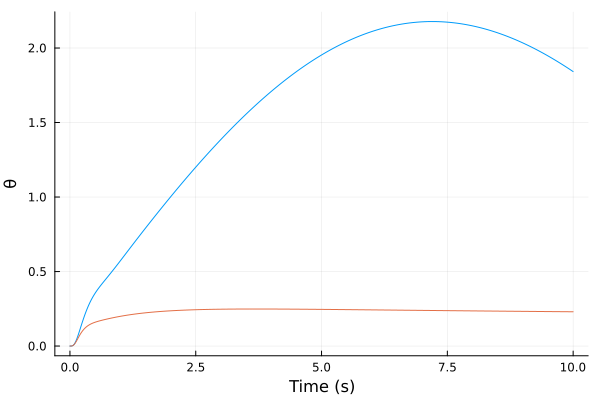

In [56]:
e2q = P_nss[:θ, :elevator_cmd]
e2q_fbk = P_nss_fbk[:θ, :elevator_cmd_fwd]
step(e2q, 10) |> plot
step(e2q_fbk, 10) |> plot!

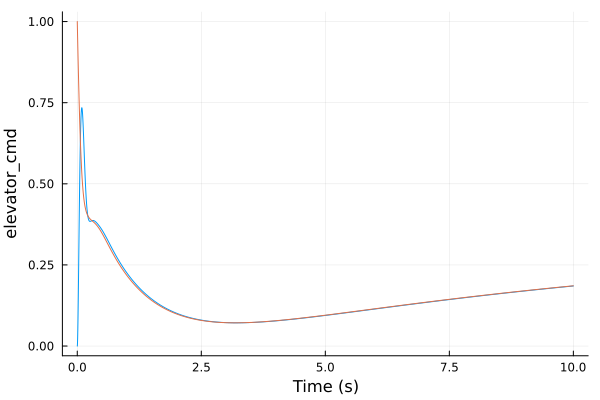

In [57]:
e2e_fbk = P_nss_fbk[:ele_p, :elevator_cmd_fwd]
e2p_fbk = P_nss_fbk[:elevator_cmd, :elevator_cmd_fwd]
step(e2e_fbk, 10) |> plot
step(e2p_fbk, 10) |> plot!

While the response is evidently improved, the steady-state elevator value resulting from an elevator unit step input is not unity. This is to be expected, given that we haven't added feedforward yet.

Now, we determine the feedforward gain matrix for commanding throttle and elevator. Following Stengel section 6.2:

In [58]:
F = P_lss.A
G = P_lss.B
H_x = P_lss.C[z_labels, :]
H_u = P_lss.D[z_labels, :]

A = [F G; H_x H_u]
B = inv(A)
B_12 = B[1:n_x, n_x+1:end]
B_22 = B[n_x+1:end, n_x+1:end]
C_fwd = B_22 + C_fbk * B_12
C_fwd_ss = named_ss(ss(C_fwd), u = z_labels_sp, y = u_labels_fwd)

display(H_x)
display(H_u)
display(C_fwd)

2×10 ComponentMatrix{Float64} with axes Axis(throttle_cmd = 1, elevator_cmd = 2) × Axis(q = 1, θ = 2, v_x = 3, v_z = 4, α_filt = 5, ω_eng = 6, thr_v = 7, thr_p = 8, ele_v = 9, ele_p = 10)
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0

2×2 ComponentMatrix{Float64} with axes Axis(throttle_cmd = 1, elevator_cmd = 2) × Axis(throttle_cmd = 1, elevator_cmd = 2)
 1.0  0.0
 0.0  1.0

2×2 Matrix{Float64}:
 1.01094   -0.503036
 0.909472   2.48315

In [59]:
connections_fwd = Pair.(C_fwd_ss.y, C_fwd_ss.y)
P_nss_SAS = connect([C_fwd_ss, P_nss_fbk], connections_fwd; w1 = z_labels_sp, z1 = P_nss_fbk.y);

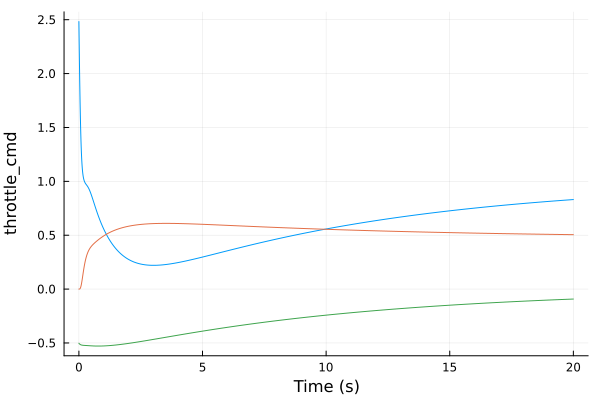

In [60]:
e2e_SAS = P_nss_SAS[:elevator_cmd, :elevator_cmd_sp]
e2θ_SAS = P_nss_SAS[:θ, :elevator_cmd_sp]
e2t_SAS = P_nss_SAS[:throttle_cmd, :elevator_cmd_sp]
step(e2e_SAS, 20) |> plot
step(e2θ_SAS, 20) |> plot!
step(e2t_SAS, 20) |> plot!

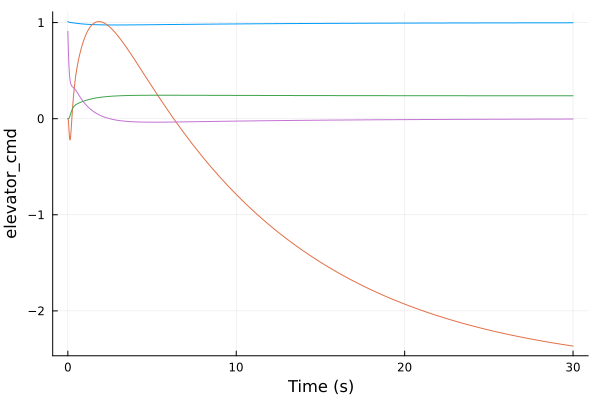

In [61]:
t2t_SAS = P_nss_SAS[:throttle_cmd, :throttle_cmd_sp]
t2v_SAS = P_nss_SAS[:EAS, :throttle_cmd_sp]
t2θ_SAS = P_nss_SAS[:θ, :throttle_cmd_sp]
t2e_SAS = P_nss_SAS[:elevator_cmd, :throttle_cmd_sp]
step(t2t_SAS, 30) |> plot
step(t2v_SAS, 30) |> plot!
step(t2θ_SAS, 30) |> plot!
step(t2e_SAS, 30) |> plot!

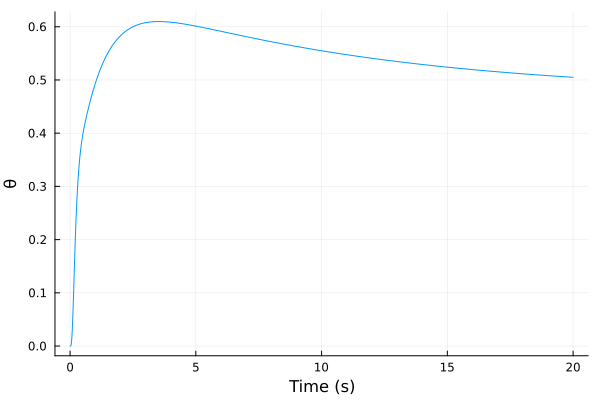

In [62]:
e2θ_SAS = P_nss_SAS[:θ, :elevator_cmd]
step(e2θ_SAS, 20) |> plot

## 2. Pitch Rate Control Augmentation

We now design a pitch rate CAS on top of the stabilized plant using classical SISO techniques.

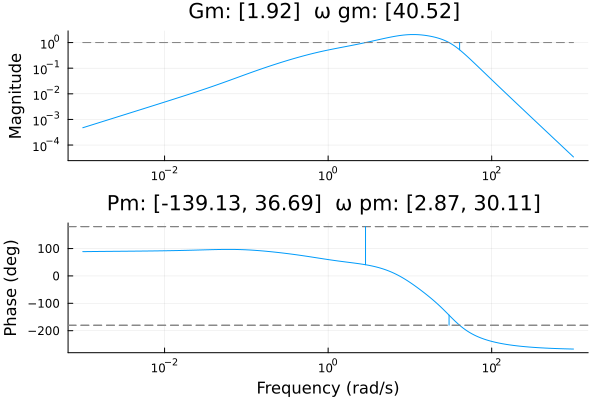

In [63]:
P_e2q = P_nss_SAS[:q, :elevator_cmd_sp]
marginplot(P_e2q)

┌ Warning: Keyword argument hover not supported with Plots.GRBackend().  Choose from: annotationcolor, annotationfontfamily, annotationfontsize, annotationhalign, annotationrotation, annotations, annotationvalign, arrow, aspect_ratio, axis, background_color, background_color_inside, background_color_outside, background_color_subplot, bar_width, bins, bottom_margin, camera, clims, color_palette, colorbar, colorbar_entry, colorbar_scale, colorbar_title, colorbar_titlefont, colorbar_titlefontcolor, colorbar_titlefontrotation, colorbar_titlefontsize, connections, contour_labels, discrete_values, fill, fill_z, fillalpha, fillcolor, fillrange, fillstyle, flip, fontfamily, fontfamily_subplot, foreground_color, foreground_color_axis, foreground_color_border, foreground_color_grid, foreground_color_subplot, foreground_color_text, formatter, framestyle, grid, gridalpha, gridlinewidth, gridstyle, group, guide, guidefont, guidefontcolor, guidefontfamily, guidefonthalign, guidefontrotation, guidefo

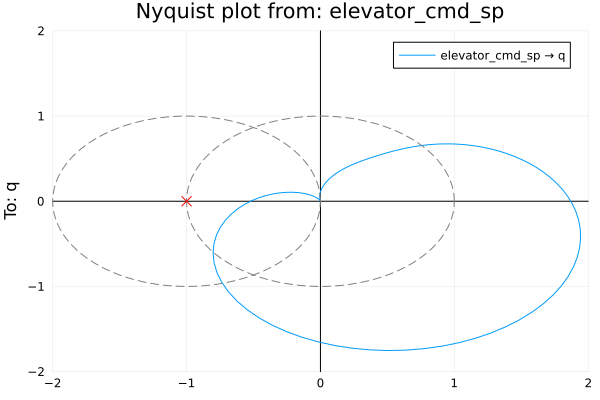

In [64]:
nyquistplot(P_e2q; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

In [65]:
q2e_int = tf(1, [1, 0]) |> ss
P_q2e_opt = series(q2e_int, ss(P_e2q))

t_sim_q2e = 10
lower_bounds = PIDParams(; k_p = 0.1, k_i = 0.0, k_d = 0.0, τ_f = 0.01)
upper_bounds = PIDParams(; k_p = 10.0, k_i = 35.0, k_d = 1.5, τ_f = 0.01)
settings = Settings(; t_sim = t_sim_q2e, lower_bounds, upper_bounds)
weights = Metrics(; Ms = 2, ∫e = 10, ef = 2, ∫u = 0.1, up = 0.00)
params_0 = PIDParams(; k_p = 1.5, k_i = 10, k_d = 0.2, τ_f = 0.01)

q2e_results = optimize_PID(P_q2e_opt; params_0, settings, weights, global_search = false)

@unpack k_p, k_i, k_d, T_i, T_d = q2e_results.params
@unpack k_p, k_i, k_d, T_i, T_d = q2e_results.params
@show k_p, k_i, k_d, T_i, T_d
@show q2e_results.metrics
@show q2e_results.exit_flag

(k_p, k_i, k_d, T_i, T_d) = (1.2802893204305092, 9.991991352288203, 0.07745067977544008, 0.12813154808598973, 0.060494669868367386)
q2e_results.metrics = [1.1482260405979037, 0.03753122844750837, 0.0020674708846513123, 0.7649004250698531, 8.025357297974518]
q2e_results.exit_flag = :ROUNDOFF_LIMITED


:ROUNDOFF_LIMITED

In [66]:
q2e_PID = build_PID(q2e_results.params)
# q2e_PID = build_PID(PIDParams(; k_p = 1.594, k_i = 15.216, k_d = 0.102))
C_q2e = named_ss(series(q2e_int, q2e_PID), :C_q2e; u = :q_err, y = :elevator_cmd_sp);

StepInfo:
Initial value:     0.000
Final value:       0.998
Step size:         0.998
Peak:              1.123
Peak time:         0.939 s
Overshoot:         12.57 %
Undershoot:         0.00 %
Settling time:     1.807 s
Rise time:         0.382 s


ε_q2e_cl(0) = [0.0;;]


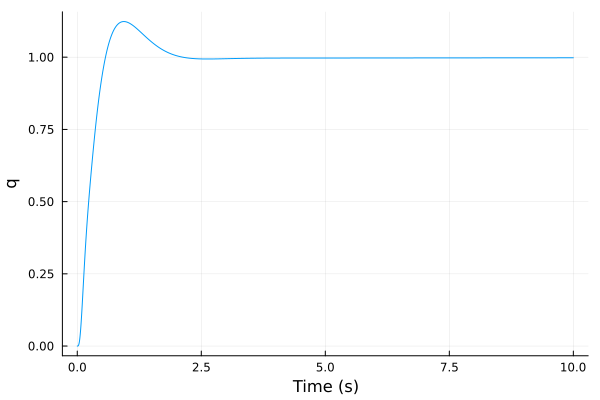

In [67]:
#steady-state error for a unit step input, now zero
L_q2e = series(C_q2e, P_e2q)
ε_q2e_cl = 1/(1+tf(L_q2e))
@show ε_q2e_cl(0)

T_q2e = output_comp_sensitivity(P_e2q, C_q2e) #this is the closed loop transfer function
T_q2e_step = step(T_q2e, t_sim_q2e)
stepinfo(T_q2e_step) |> display
T_q2e_step |> plot

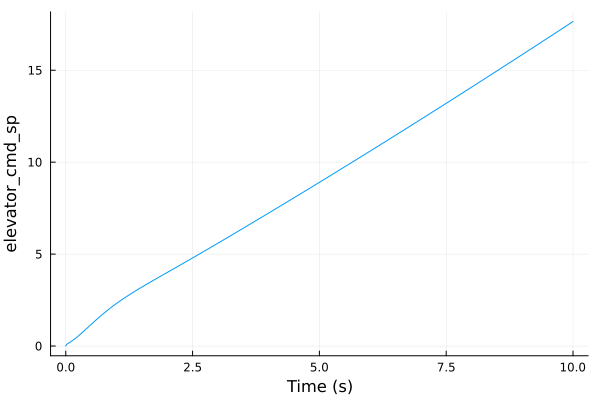

In [68]:
CS_q2e = G_CS(P_e2q, C_q2e)
CS_q2e_step = step(CS_q2e, t_sim_q2e)
CS_q2e_step |> plot

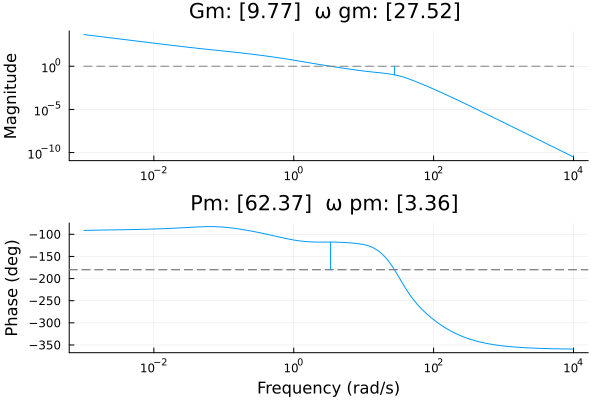

In [69]:
marginplot(L_q2e)

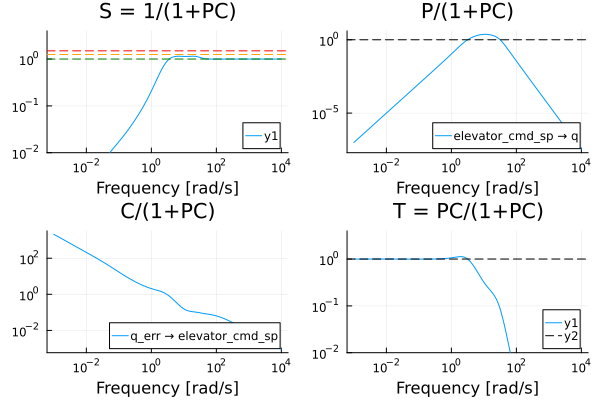

In [70]:
gangoffourplot(P_e2q, C_q2e)

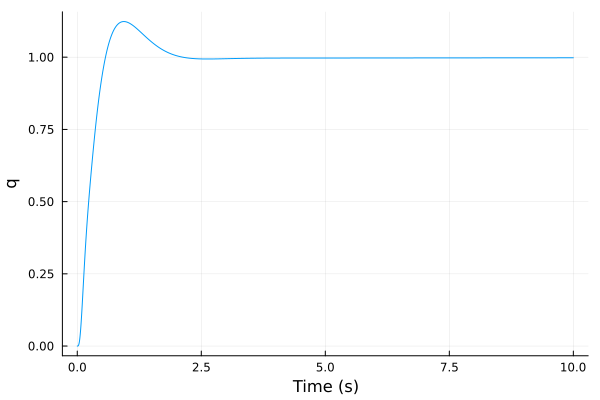

In [71]:
q2e_sum = sumblock("q_err = q_sp - q")
P_nss_tq = connect([q2e_sum, C_q2e, P_nss_SAS], [:q_err=>:q_err, :q=>:q, :elevator_cmd_sp=>:elevator_cmd_sp], w1 = [:throttle_cmd_sp, :q_sp], z1 = P_nss_SAS.y)

#verify we get the same response as with the SISO closed loop
qsp2q = P_nss_tq[:q, :q_sp]
step(qsp2q, t_sim_q2e) |> plot

#and we see that the response matches that of the SISO design

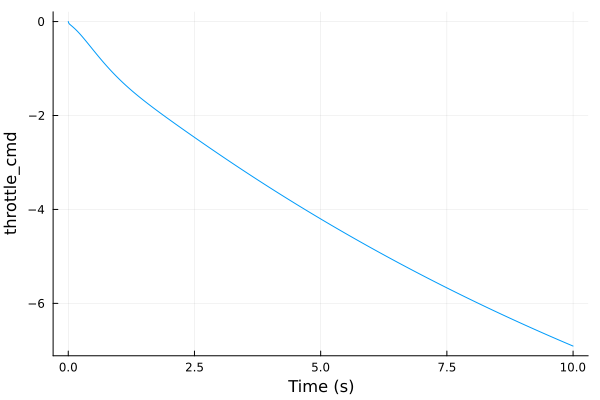

In [72]:
qsp2t = P_nss_tq[:throttle_cmd, :q_sp]
step(qsp2t, t_sim_q2e) |> plot

## 3. EAS Control Augmentation

To design a SISO EAS-to-throttle controller, we should start from the SAS plant with additional pitch rate control. The throttle-to-EAS response of the raw SAS plant is unsuitable. The raw SAS plant tracks throttle_cmd and elevator_cmd directly, so when a throttle_cmd step input is applied, the plant settles on a new equilibrium in which elevator_cmd remains the same and throttle_cmd has increased. In some cases this equilibrium has a higher pitch angle and a lower EAS than before. So this leads to the unintuitive scenario in which an increase in throttle actually causes airspeed to decrease. This behaviour is fixed by the external q loop, because by maintaining pitch attitude it ensures that the throttle increase will actually lead to an airspeed increase.

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -2.72e-05          |  1            |  2.72e-05     |  4.33e-06     |  3.68e+04     |
| -0.0677            |  1            |  0.0677       |  0.0108       |  14.8         |
| -2.24   ±   1.85im |  0.771        |  2.9          |  0.462        |  0.447        |
| -9.36   ±   4.45im |  0.903        |  10.4         |  1.65         |  0.107        |
| -11.7              |  1            |  11.7         |  1.87         |  0.0851       |
| -16.7   ±   24.1im |  0.57         |  29.3         |  4.67         |  0.0598       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -46.9              |  1            |  46.9         |  7.47         |  0.0213       |
| -99.6              |  1            |  99.

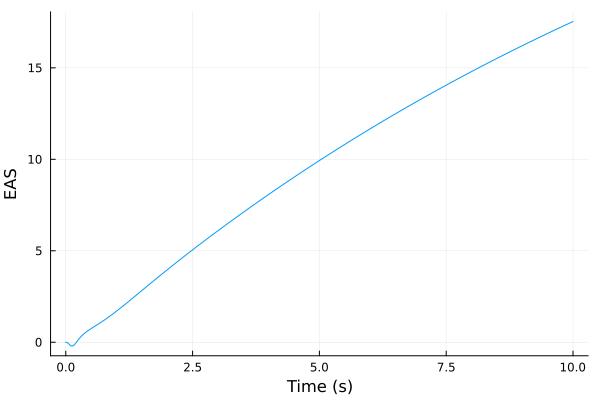

In [73]:
P_t2v = P_nss_tq[:EAS, :throttle_cmd]
dampreport(P_t2v)
step(P_t2v, 10) |> plot

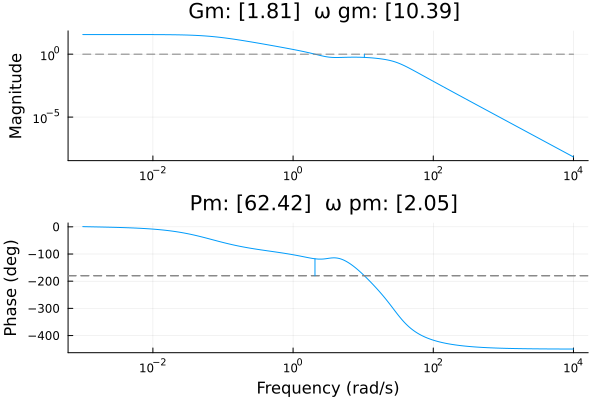

In [74]:
#error transfer function for a unit feedback closed loop and a unit step input
marginplot(P_t2v)

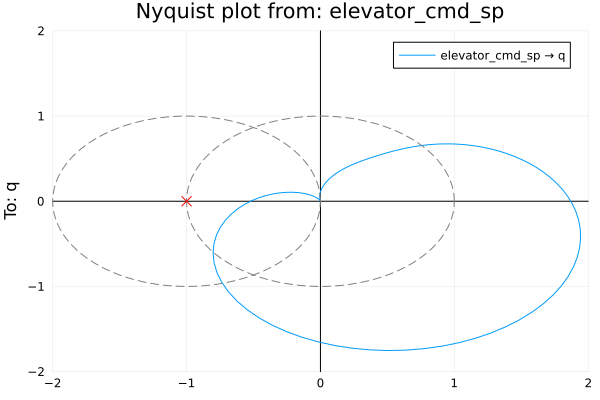

In [75]:
nyquistplot(P_e2q; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

In [76]:
t_sim_v2t = 10
lower_bounds = PIDParams(; k_p = 0.01, k_i = 0.0, k_d = 0.0, τ_f = 0.01)
upper_bounds = PIDParams(; k_p = 1.0, k_i = 2.0, k_d = 0.0, τ_f = 0.01)
settings = Settings(; t_sim = t_sim_v2t, maxeval = 5000, lower_bounds, upper_bounds)
weights = Metrics(; Ms = 5.0, ∫e = 10.0, ef = 1.0, ∫u = 0.0, up = 0.0)
params_0 = PIDParams(; k_p = 0.2, k_i = 0.1, k_d = 0.0, τ_f = 0.01)

v2t_results = optimize_PID(P_t2v; params_0, settings, weights, global_search = false)
v2t_PID = build_PID(v2t_results.params)

C_v2t = named_ss(ss(v2t_PID), :C_v2t; u = :EAS_err, y = :throttle_cmd_sp)
L_v2t = series(C_v2t, P_t2v)

@unpack k_p, k_i, k_d, T_i, T_d = v2t_results.params
@show k_p, k_i, k_d, T_i, T_d
@show v2t_results.metrics
@show v2t_results.exit_flag

(k_p, k_i, k_d, T_i, T_d) = (0.3107140075037268, 0.021812805558438172, 0.0, 14.244568708564344, 0.0)
v2t_results.metrics = [1.209646873807182, 0.12995242670095775, 0.0018243281686425306, 0.9345942945213359, 0.9724956416287565]
v2t_results.exit_flag = :ROUNDOFF_LIMITED


:ROUNDOFF_LIMITED

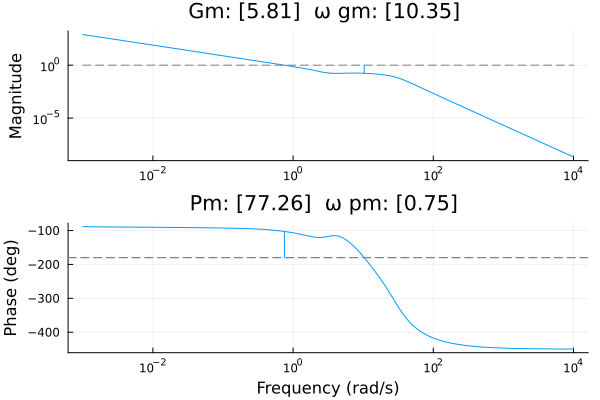

In [77]:
marginplot(L_v2t)

StepInfo:
Initial value:     0.000
Final value:       1.002
Step size:         1.002
Peak:              1.002
Peak time:         8.745 s
Overshoot:          0.01 %
Undershoot:         6.68 %
Settling time:     3.977 s
Rise time:         2.240 s


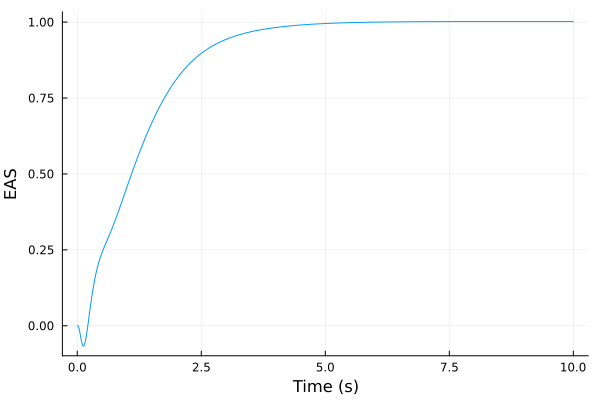

In [78]:
T_v2t = output_comp_sensitivity(P_t2v, C_v2t)
T_v2t_step = step(T_v2t, t_sim_v2t)
stepinfo(T_v2t_step) |> display
T_v2t_step |> plot

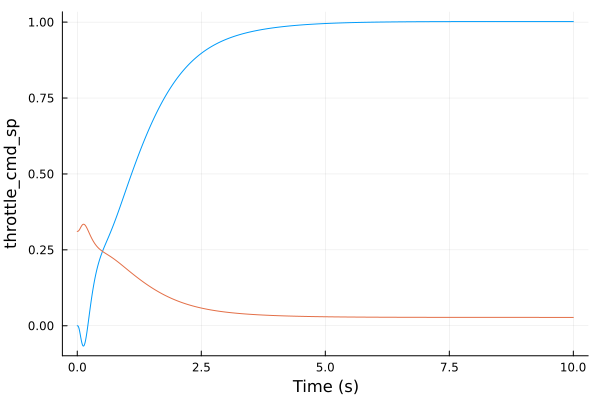

In [79]:
CS_v2t = G_CS(P_t2v, C_v2t)
CS_v2t_step = step(CS_v2t, t_sim_v2t)
CS_v2t_step |> plot!

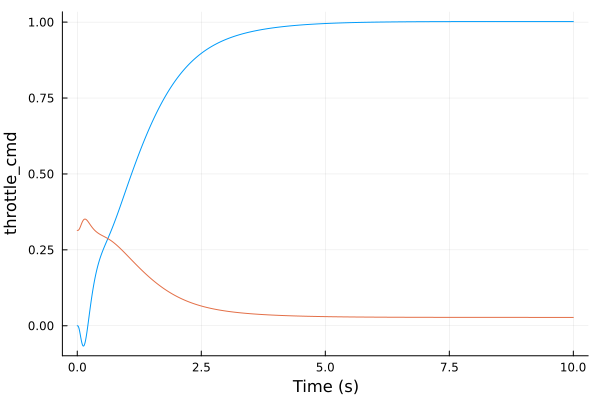

In [80]:
v2t_sum = sumblock("EAS_err = EAS_sp - EAS")
P_nss_vq = connect([v2t_sum, C_v2t, P_nss_tq], [:EAS_err=>:EAS_err, :EAS=>:EAS, :throttle_cmd_sp=>:throttle_cmd_sp], w1 = [:EAS_sp, :q_sp], z1 = P_nss_tq.y)

#check we get the same response as with the SISO closed loop
EASsp2EAS = P_nss_vq[:EAS, :EAS_sp]
EASsp2thr = P_nss_vq[:throttle_cmd, :EAS_sp]
step(EASsp2EAS, t_sim_v2t) |> plot
step(EASsp2thr, t_sim_v2t) |> plot!

## 4. EAS + Climb Rate Control

We start again from the non-stabilized plant. This is a true MIMO control mode with integral control in both command variables, and it requires completely new gain matrices.

In [81]:
#define command variables
z_labels = [:EAS, :climb_rate]
@assert tuple(z_labels...) === propertynames(C172FBWMCS.ZLonEASClm())
z_trim = P_lss.y0[z_labels]
n_z = length(z_labels)

z_labels_sp = Symbol.(string.(z_labels) .* "_sp")


2-element Vector{Symbol}:
 :EAS_sp
 :climb_rate_sp

In [82]:
F = P_lss.A
G = P_lss.B
Hx = P_lss.C[z_labels, :]
Hu = P_lss.D[z_labels, :]
display(Hx)
display(Hu)

#define the blocks corresponding to the subset of the command variables for
#which integral compensation is required. in this case, both
Hx_int = Hx[z_labels, :]
Hu_int = Hu[z_labels, :]
n_int, _ = size(Hx_int)

F_aug = [F zeros(n_x, n_int); Hx_int zeros(n_int, n_int)]
G_aug = [G; Hu_int]
Hx_aug = [Hx zeros(n_z, n_int)]
Hu_aug = Hu

P_aug = ss(F_aug, G_aug, Hx_aug, Hu_aug)
controllability(F_aug, G_aug)

2×10 ComponentMatrix{Float64} with axes Axis(EAS = 1, climb_rate = 2) × Axis(q = 1, θ = 2, v_x = 3, v_z = 4, α_filt = 5, ω_eng = 6, thr_v = 7, thr_p = 8, ele_v = 9, ele_p = 10)
 0.0   0.0    0.952352    0.0224354  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  52.487  0.0235513  -0.999722   0.0  0.0  0.0  0.0  0.0  0.0

2×2 ComponentMatrix{Float64} with axes Axis(EAS = 1, climb_rate = 2) × Axis(throttle_cmd = 1, elevator_cmd = 2)
 0.0  0.0
 0.0  0.0

(iscontrollable = true, ranks = [12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12], sigma_min = [0.004930009048801151, 1.206072542492956, 1.2060725424929568, 1.2060725424929568, 1.206072542492956, 0.43830862575065466, 0.43362003140242156, 0.43362003140242156, 0.021305878964452938, 0.021305878964452938, 0.006883372377173668, 0.006883372377173668])

In [83]:
@unpack x0, u0 = P_lss
@unpack v_x, v_z = x0
v_norm = norm([v_x, v_z])

#weight matrices
Q = ComponentVector(q = 1, θ = 100, v_x = 10/v_norm, v_z = 1/v_norm, α_filt = 1, ω_eng = 0, thr_v = 0.0, thr_p = 0, ele_v = 0, ele_p = 0, ξ_EAS = 0.005, ξ_climb_rate = 0.001) |> diagm
R = C172FBWMCS.ULon(throttle_cmd = 1, elevator_cmd = 1) |> diagm

#compute gain matrix
C_aug = lqr(P_aug, Q, R)

# quickly construct the closed-loop augmented system to check the resulting
# eigenvalues, we'll do the connections properly later
F_aug_cl = F_aug - G_aug * C_aug
P_aug_cl = ss(F_aug_cl, G_aug, Hx_aug, Hu_aug)

dampreport(P_aug)
dampreport(P_aug_cl)

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| +0                 |  -1           |  0            |  0            |  -Inf         |
| +0                 |  -1           |  0            |  0            |  -Inf         |
| -0.0195 ±  0.232im |  0.0838       |  0.232        |  0.037        |  51.4         |
| -5.55   ±   6.27im |  0.663        |  8.37         |  1.33         |  0.18         |
| -11.7              |  1            |  11.7         |  1.86         |  0.0856       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -47.2              |  1            |  47.2         |  7.51         |  0.0212       |
|        Pole        |   Damping     |   Fr

In [84]:
#extract system state and integrator blocks from the feedback matrix
C_x = C_aug[:, 1:n_x]
C_ξ = C_aug[:, n_x+1:end]
display(C_ξ)

2×2 Matrix{Float64}:
  0.0659403  0.0114182
 -0.0255319  0.0294894

In [85]:
#some useful signal labels
u_labels_fbk = Symbol.(string.(u_labels) .* "_fbk")
u_labels_fwd = Symbol.(string.(u_labels) .* "_fwd")
u_labels_sum = Symbol.(string.(u_labels) .* "_sum")
u_labels_int_u = Symbol.(string.(u_labels) .* "_int_u")
u_labels_int = Symbol.(string.(u_labels) .* "_int")
u_labels_ξ = Symbol.(string.(u_labels) .* "_ξ")

z_labels_sp = Symbol.(string.(z_labels) .* "_sp")
z_labels_sp1 = Symbol.(string.(z_labels) .* "_sp1")
z_labels_sp2 = Symbol.(string.(z_labels) .* "_sp2")
z_labels_err = Symbol.(string.(z_labels) .* "_err")
z_labels_sum = Symbol.(string.(z_labels) .* "_sum")
z_labels_sp_fwd = Symbol.(string.(z_labels) .* "_sp_fwd")
z_labels_sp_sum = Symbol.(string.(z_labels) .* "_sp_sum")

A = [F G; Hx Hu]
B = inv(A)
B_12 = B[1:n_x, n_x+1:end]
B_22 = B[n_x+1:end, n_x+1:end]

C_fbk = C_x
C_fbk_ss = named_ss(ss(C_fbk), u = x_labels, y = u_labels_fbk)

C_fwd = B_22 + C_x * B_12
C_fwd_ss = named_ss(ss(C_fwd), u = z_labels_sp_fwd, y = u_labels_fwd)

C_int = C_ξ
C_int_ss = named_ss(ss(C_int), u = z_labels_err, y = u_labels_int_u)

int_ss = named_ss(ss(tf(1, [1,0])) .* I(2),
                    x = u_labels_ξ,
                    u = u_labels_int_u,
                    y = u_labels_int);

display(C_fbk_ss)
display(C_fwd_ss)
display(C_int_ss)
display(int_ss)

EAS_err_sum = sumblock("EAS_err = EAS_sum - EAS_sp_sum")
climb_rate_err_sum = sumblock("climb_rate_err = climb_rate_sum - climb_rate_sp_sum")

throttle_cmd_sum = sumblock("throttle_cmd_sum = throttle_cmd_fwd - throttle_cmd_fbk - throttle_cmd_int")
elevator_cmd_sum = sumblock("elevator_cmd_sum = elevator_cmd_fwd - elevator_cmd_fbk - elevator_cmd_int")

EAS_sp_splitter = splitter(:EAS_sp, 2)
climb_rate_sp_splitter = splitter(:climb_rate_sp, 2)

connections = vcat(
    Pair.(x_labels, x_labels),
    Pair.(z_labels, z_labels_sum),
    Pair.(z_labels_sp1, z_labels_sp_sum),
    Pair.(z_labels_sp2, z_labels_sp_fwd),
    Pair.(z_labels_err, z_labels_err),
    Pair.(u_labels_sum, u_labels),
    Pair.(u_labels_fwd, u_labels_fwd),
    Pair.(u_labels_fbk, u_labels_fbk),
    Pair.(u_labels_int, u_labels_int),
    Pair.(u_labels_int_u, u_labels_int_u),
    )

P_nss_vc = connect([P_nss, int_ss, C_fwd_ss, C_fbk_ss, C_int_ss,
                    EAS_err_sum, climb_rate_err_sum,
                    throttle_cmd_sum, elevator_cmd_sum,
                    EAS_sp_splitter, climb_rate_sp_splitter], connections;
                    w1 = z_labels_sp, z1 = vcat(y_labels))

dampreport(P_nss_vc)

P_nss_vc

NamedStateSpace{Continuous, Float64}
D = 
 0.24335441866162646  -0.7451633135779487   0.4581447028305436    0.0170796092659144   -0.08982480773378188  0.0007964831572018573   0.0009650095500358952   0.036840872793759395    -5.171185442749201e-5  -0.004531238222336622
 1.0349192386406743   11.594243543681833   -0.13907856403175659  -0.13780933205142779   3.116143848801585    1.3024952077838244e-5  -5.171185442749201e-5   -0.00011535118209377134   0.013683173407905407   0.6082387281426884

Continuous-time state-space model
With state  names: 
     input  names: q θ v_x v_z α_filt ω_eng thr_v thr_p ele_v ele_p
     output names: throttle_cmd_fbk elevator_cmd_fbk


NamedStateSpace{Continuous, Float64}
D = 
  0.49820704864620763  0.08146260679293849
 -0.19715323177303865  0.21529784801971474

Continuous-time state-space model
With state  names: 
     input  names: EAS_sp_fwd climb_rate_sp_fwd
     output names: throttle_cmd_fwd elevator_cmd_fwd


NamedStateSpace{Continuous, Float64}
D = 
  0.06594029151826035  0.011418213124040674
 -0.02553190069616634  0.02948939486558681

Continuous-time state-space model
With state  names: 
     input  names: EAS_err climb_rate_err
     output names: throttle_cmd_int_u elevator_cmd_int_u


NamedStateSpace{Continuous, Float64}
A = 
 0.0  0.0
 0.0  0.0
B = 
 1.0  0.0
 0.0  1.0
C = 
 1.0  0.0
 0.0  1.0
D = 
 0.0  0.0
 0.0  0.0

Continuous-time state-space model
With state  names: throttle_cmd_ξ elevator_cmd_ξ
     input  names: throttle_cmd_int_u elevator_cmd_int_u
     output names: throttle_cmd_int elevator_cmd_int


|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| -0.154  ± 0.0035im |  1            |  0.154        |  0.0245       |  6.51         |
| -1.29   ± 0.0659im |  0.999        |  1.29         |  0.205        |  0.777        |
| -11.6              |  1            |  11.6         |  1.85         |  0.0859       |
| -12     ±   6.41im |  0.882        |  13.6         |  2.17         |  0.0832       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -18.2   ±   26.8im |  0.562        |  32.4         |  5.16         |  0.0549       |
| -47.1              |  1            |  47.1         |  7.5          |  0.0212       |


NamedStateSpace{Continuous, Float64}
A = 
    -5.087133389340867       -4.163952206884258e-6      0.07439010318783776    -3.855197048106838        147.752436741745      0.003705232785276937    0.0                       0.0                    0.0                     14.004653912859027     0.0                 0.0
     0.9999996012993818       7.289779959879282e-14     1.577731388461316e-7    3.7167542262347856e-9      0.0                 0.0                     0.0                       0.0                    0.0                      0.0                   0.0                 0.0
     1.8618422918962096      -9.774472547862793        -0.13232567621694288     2.444235010787566        -90.97971007015505    0.018752902023367796    0.0                       0.0                    0.0                     -8.022244373712233     0.0                 0.0
    51.034531843519005       -0.23025870981041408      -0.299019483246052      -3.134584249314811         32.58157204233016    6.205354832396194e

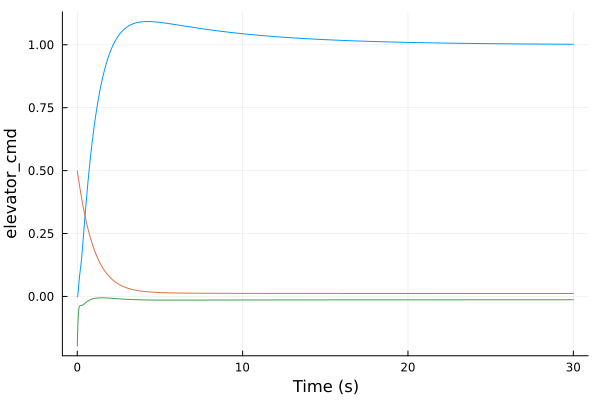

In [86]:
EASsp2EAS = P_nss_vc[:EAS, :EAS_sp]
EASsp2thr = P_nss_vc[:throttle_cmd, :EAS_sp]
EASsp2ele = P_nss_vc[:elevator_cmd, :EAS_sp]
step(EASsp2EAS, 30) |> plot
step(EASsp2thr, 30) |> plot!
step(EASsp2ele, 30) |> plot!

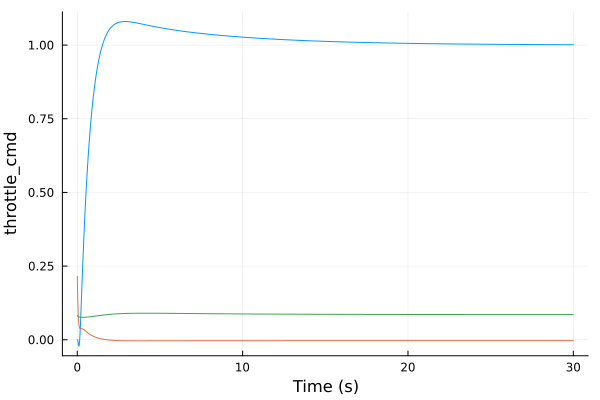

In [87]:
crsp2cr = P_nss_vc[:climb_rate, :climb_rate_sp]
crsp2ele = P_nss_vc[:elevator_cmd, :climb_rate_sp]
crsp2thr = P_nss_vc[:throttle_cmd, :climb_rate_sp]
step(crsp2cr, 30) |> plot
step(crsp2ele, 30) |> plot!
step(crsp2thr, 30) |> plot!

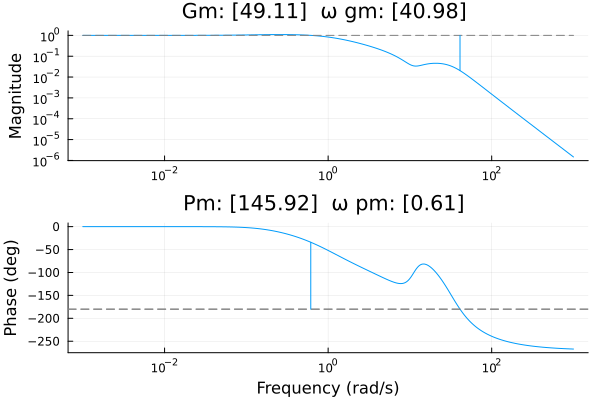

In [88]:
marginplot(EASsp2EAS)

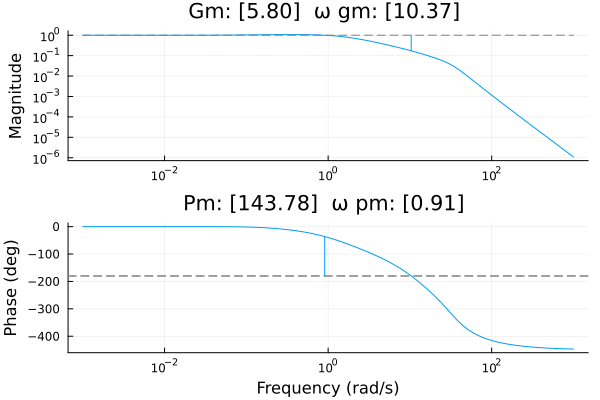

In [89]:
marginplot(crsp2cr)

## 5. EAS + Throttle Control

We start again from the non-stabilized plant. This is a true MIMO control mode with integral control in both command variables, and it requires completely new gain matrices.

In [90]:
#define command variables
z_labels = [:EAS, :throttle_cmd]
@assert tuple(z_labels...) === propertynames(C172FBWMCS.ZLonEASThr())
z_trim = P_lss.y0[z_labels]
n_z = length(z_labels)

z_labels_sp = Symbol.(string.(z_labels) .* "_sp")


2-element Vector{Symbol}:
 :EAS_sp
 :throttle_cmd_sp

In [91]:
F = P_lss.A
G = P_lss.B
Hx = P_lss.C[z_labels, :]
Hu = P_lss.D[z_labels, :]
display(Hx)
display(Hu)

#define the blocks corresponding to the subset of the command variables for
#which integral compensation is required. in this case, only one of them (EAS).
#Since the resulting blocks have only one row, we get vectors, which we need to
#transpose to get the desired row matrices back.
Hx_int = Hx[:EAS, :]'
Hu_int = Hu[:EAS, :]'
n_int, _ = size(Hx_int)
display(Hx_int)
display(Hu_int)

F_aug = [F zeros(n_x, n_int); Hx_int zeros(n_int, n_int)]
G_aug = [G; Hu_int]
Hx_aug = [Hx zeros(n_z, n_int)]
Hu_aug = Hu

P_aug = ss(F_aug, G_aug, Hx_aug, Hu_aug)
controllability(F_aug, G_aug)

2×10 ComponentMatrix{Float64} with axes Axis(EAS = 1, throttle_cmd = 2) × Axis(q = 1, θ = 2, v_x = 3, v_z = 4, α_filt = 5, ω_eng = 6, thr_v = 7, thr_p = 8, ele_v = 9, ele_p = 10)
 0.0  0.0  0.952352  0.0224354  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0       0.0        0.0  0.0  0.0  0.0  0.0  0.0

2×2 ComponentMatrix{Float64} with axes Axis(EAS = 1, throttle_cmd = 2) × Axis(throttle_cmd = 1, elevator_cmd = 2)
 0.0  0.0
 1.0  0.0

1×10 adjoint(::ComponentVector{Float64, Vector{Float64}, Tuple{Axis{(q = 1, θ = 2, v_x = 3, v_z = 4, α_filt = 5, ω_eng = 6, thr_v = 7, thr_p = 8, ele_v = 9, ele_p = 10)}}}) with eltype Float64 with indices Base.OneTo(1)×1:1:10:
 0.0  0.0  0.952352  0.0224354  0.0  0.0  0.0  0.0  0.0  0.0

1×2 adjoint(::ComponentVector{Float64, Vector{Float64}, Tuple{Axis{(throttle_cmd = 1, elevator_cmd = 2)}}}) with eltype Float64 with indices Base.OneTo(1)×1:1:2:
 0.0  0.0

(iscontrollable = true, ranks = [11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11], sigma_min = [0.004930009049785164, 1.2060726405442117, 1.2060726405442117, 1.2060726405442117, 1.2060726405442117, 0.43833051142545704, 0.43362154390169627, 0.43362154390169627, 0.03989360336224349, 0.03989360336224349, 0.04012233308390007])

In [92]:
@unpack x0, u0 = P_lss
@unpack v_x, v_z = x0
v_norm = norm([v_x, v_z])

#weight matrices
Q = ComponentVector(q = 1, θ = 100, v_x = 10/v_norm, v_z = 1/v_norm, α_filt = 1, ω_eng = 0, thr_v = 0.0, thr_p = 0, ele_v = 0, ele_p = 0, ξ_EAS = 0.005) |> diagm
R = C172FBWMCS.ULon(throttle_cmd = 1, elevator_cmd = 1) |> diagm

#compute gain matrix
C_aug = lqr(P_aug, Q, R)

# quickly construct the closed-loop augmented system to check the resulting
# eigenvalues, we'll do the connections properly later
F_aug_cl = F_aug - G_aug * C_aug
P_aug_cl = ss(F_aug_cl, G_aug, Hx_aug, Hu_aug)

dampreport(P_aug)
dampreport(P_aug_cl)

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| +0                 |  -1           |  0            |  0            |  -Inf         |
| -0.0195 ±  0.232im |  0.0838       |  0.232        |  0.037        |  51.4         |
| -5.55   ±   6.27im |  0.663        |  8.37         |  1.33         |  0.18         |
| -11.7              |  1            |  11.7         |  1.86         |  0.0856       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -47.2              |  1            |  47.2         |  7.51         |  0.0212       |
|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (r

In [93]:
#extract system state and integrator blocks from the feedback matrix
C_x = C_aug[:, 1:n_x]
C_ξ = C_aug[:, n_x+1:end]
display(C_ξ)

2×1 Matrix{Float64}:
  0.06617122954414081
 -0.024927261800747107

In [94]:
#some useful signal labels
u_labels_fbk = Symbol.(string.(u_labels) .* "_fbk")
u_labels_fwd = Symbol.(string.(u_labels) .* "_fwd")
u_labels_sum = Symbol.(string.(u_labels) .* "_sum")
u_labels_int_u = Symbol.(string.(u_labels) .* "_int_u")
u_labels_int = Symbol.(string.(u_labels) .* "_int")
u_labels_ξ = Symbol.(string.(u_labels) .* "_ξ")

z_labels_sp = Symbol.(string.(z_labels) .* "_sp")
z_labels_sp1 = Symbol.(string.(z_labels) .* "_sp1")
z_labels_sp2 = Symbol.(string.(z_labels) .* "_sp2")
z_labels_err = Symbol.(string.(z_labels) .* "_err")
z_labels_sum = Symbol.(string.(z_labels) .* "_sum")
z_labels_sp_fwd = Symbol.(string.(z_labels) .* "_sp_fwd")
z_labels_sp_sum = Symbol.(string.(z_labels) .* "_sp_sum")

A = [F G; Hx Hu]
B = inv(A)
B_12 = B[1:n_x, n_x+1:end]
B_22 = B[n_x+1:end, n_x+1:end]

C_fbk = C_x
C_fbk_ss = named_ss(ss(C_fbk), u = x_labels, y = u_labels_fbk)

C_fwd = B_22 + C_x * B_12
C_fwd_ss = named_ss(ss(C_fwd), u = z_labels_sp_fwd, y = u_labels_fwd)

#the integral gain matrix is constructed by padding C_ξ with zeros in those
#columns corresponding to command variables without integral compensation
C_int = ComponentMatrix(zeros(n_u, n_z), Axis(u_labels), Axis(z_labels))
C_int[:, :EAS] .= C_ξ
C_int_ss = named_ss(ss(C_int), u = z_labels_err, y = u_labels_int_u)

int_ss = named_ss(ss(tf(1, [1,0])) .* I(2),
                    x = u_labels_ξ,
                    u = u_labels_int_u,
                    y = u_labels_int);

display(C_fbk_ss)
display(C_fwd_ss)
display(C_int_ss)
display(int_ss)

EAS_err_sum = sumblock("EAS_err = EAS_sum - EAS_sp_sum")
throttle_cmd_err_sum = sumblock("throttle_cmd_err = throttle_cmd_sum - throttle_cmd_sp_sum")

throttle_cmd_sum = sumblock("throttle_cmd_sum = throttle_cmd_fwd - throttle_cmd_fbk - throttle_cmd_int")
elevator_cmd_sum = sumblock("elevator_cmd_sum = elevator_cmd_fwd - elevator_cmd_fbk - elevator_cmd_int")

EAS_sp_splitter = splitter(:EAS_sp, 2)
throttle_cmd_sp_splitter = splitter(:throttle_cmd_sp, 2)

connections = vcat(
    Pair.(x_labels, x_labels),
    Pair.(z_labels, z_labels_sum),
    Pair.(z_labels_sp1, z_labels_sp_sum),
    Pair.(z_labels_sp2, z_labels_sp_fwd),
    Pair.(z_labels_err, z_labels_err),
    Pair.(u_labels_sum, u_labels),
    Pair.(u_labels_fwd, u_labels_fwd),
    Pair.(u_labels_fbk, u_labels_fbk),
    Pair.(u_labels_int, u_labels_int),
    Pair.(u_labels_int_u, u_labels_int_u),
    )

P_nss_vt = connect([P_nss, int_ss, C_fwd_ss, C_fbk_ss, C_int_ss,
                    EAS_err_sum, throttle_cmd_err_sum,
                    throttle_cmd_sum, elevator_cmd_sum,
                    EAS_sp_splitter, throttle_cmd_sp_splitter], connections;
                    w1 = z_labels_sp, z1 = vcat(y_labels))

dampreport(P_nss_vt)

P_nss_vc

NamedStateSpace{Continuous, Float64}
D = 
 0.2301819077410062  -1.170281681876012   0.4490017777171941    0.02335108248965548  -0.10498423133769583   0.0007789280887942916   0.0009441539911708523    0.03603884274550451    -0.00010239855538431585  -0.0071194931209735334
 1.0020506882470919  10.513149092515299  -0.16127608219749126  -0.12184432664259633   3.07755570251572     -2.9708726776219736e-5  -0.00010239855538431585  -0.0020664834432386364   0.013554749608727245     0.6016749271174682

Continuous-time state-space model
With state  names: 
     input  names: q θ v_x v_z α_filt ω_eng thr_v thr_p ele_v ele_p
     output names: throttle_cmd_fbk elevator_cmd_fbk


NamedStateSpace{Continuous, Float64}
D = 
  0.4789184155172144   0.8572085755852676
 -0.24622253417163728  2.275522514333503

Continuous-time state-space model
With state  names: 
     input  names: EAS_sp_fwd throttle_cmd_sp_fwd
     output names: throttle_cmd_fwd elevator_cmd_fwd


NamedStateSpace{Continuous, Float64}
D = 
  0.06617122954414081   0.0
 -0.024927261800747107  0.0

Continuous-time state-space model
With state  names: 
     input  names: EAS_err throttle_cmd_err
     output names: throttle_cmd_int_u elevator_cmd_int_u


NamedStateSpace{Continuous, Float64}
A = 
 0.0  0.0
 0.0  0.0
B = 
 1.0  0.0
 0.0  1.0
C = 
 1.0  0.0
 0.0  1.0
D = 
 0.0  0.0
 0.0  0.0

Continuous-time state-space model
With state  names: throttle_cmd_ξ elevator_cmd_ξ
     input  names: throttle_cmd_int_u elevator_cmd_int_u
     output names: throttle_cmd_int elevator_cmd_int


|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+
| +5.45e-16          |  -1           |  5.45e-16     |  8.68e-17     |  -1.83e+15    |
| -0.155             |  1            |  0.155        |  0.0247       |  6.46         |
| -1.26              |  1            |  1.26         |  0.201        |  0.792        |
| -1.31              |  1            |  1.31         |  0.209        |  0.761        |
| -11.6              |  1            |  11.6         |  1.85         |  0.0859       |
| -12     ±   6.41im |  0.882        |  13.6         |  2.17         |  0.0832       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |
| -18.2   ±   26.8im |  0.562        |  32.4         |  5.16         |  0.0549       |
| -47.1              |  1            |  47.

NamedStateSpace{Continuous, Float64}
A = 
    -5.087133389340867       -4.163952206884258e-6      0.07439010318783776    -3.855197048106838        147.752436741745      0.003705232785276937    0.0                       0.0                    0.0                     14.004653912859027     0.0                 0.0
     0.9999996012993818       7.289779959879282e-14     1.577731388461316e-7    3.7167542262347856e-9      0.0                 0.0                     0.0                       0.0                    0.0                      0.0                   0.0                 0.0
     1.8618422918962096      -9.774472547862793        -0.13232567621694288     2.444235010787566        -90.97971007015505    0.018752902023367796    0.0                       0.0                    0.0                     -8.022244373712233     0.0                 0.0
    51.034531843519005       -0.23025870981041408      -0.299019483246052      -3.134584249314811         32.58157204233016    6.205354832396194e

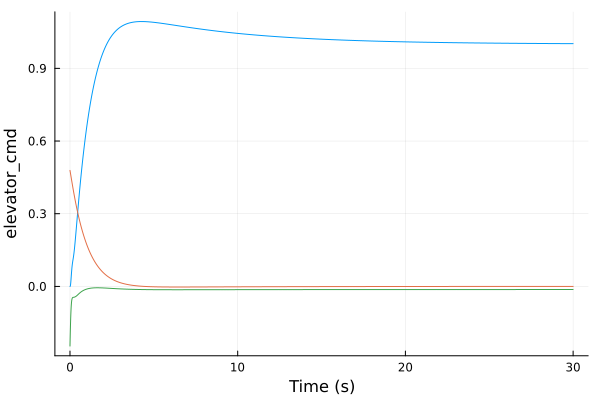

In [95]:
EASsp2EAS = P_nss_vt[:EAS, :EAS_sp]
EASsp2thr = P_nss_vt[:throttle_cmd, :EAS_sp]
EASsp2ele = P_nss_vt[:elevator_cmd, :EAS_sp]
step(EASsp2EAS, 30) |> plot
step(EASsp2thr, 30) |> plot!
step(EASsp2ele, 30) |> plot!

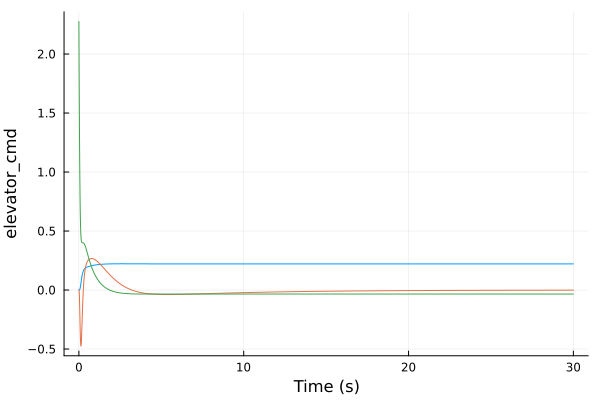

In [96]:
thr2θ = P_nss_vt[:θ, :throttle_cmd]
thr2EAS = P_nss_vt[:EAS, :throttle_cmd]
thr2ele = P_nss_vt[:elevator_cmd, :throttle_cmd]
step(thr2θ, 30) |> plot
step(thr2EAS, 30) |> plot!
step(thr2ele, 30) |> plot!

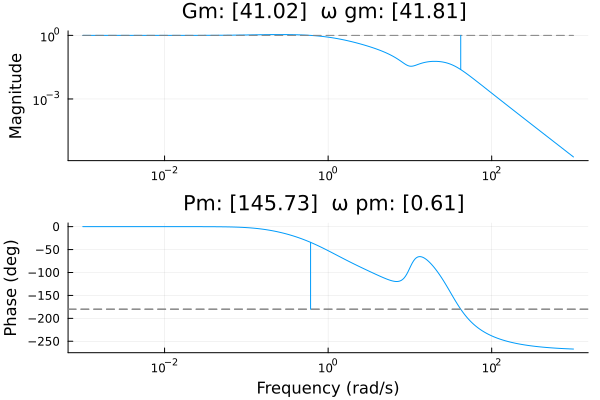

In [97]:
marginplot(EASsp2EAS)

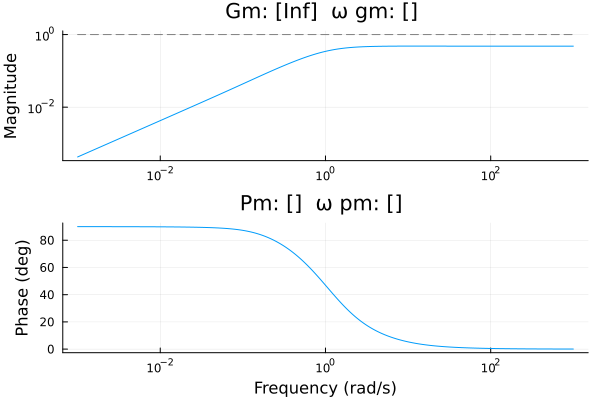

In [98]:
marginplot(EASsp2thr)